# Stress Testing: Event Impact Concept using 2014 Yellow Cab Trips for St. Patrick's Day Parade and Macy's Thanksgiving Day Parade

## 0. Below are the two plots detailing the main takeaways


### LEFT: Crude baseline busyness timeline, RIGHT: St. Patrick's Day Parade 2014.

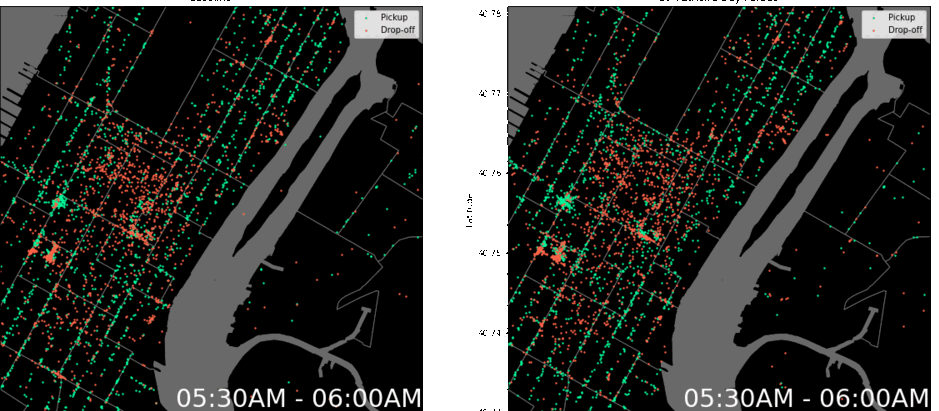

<br>
<br>
<br>

### LEFT: MACY'S THANKSGIVING PARADE 2014,   RIGHT: Crude baseline busyness timeline.


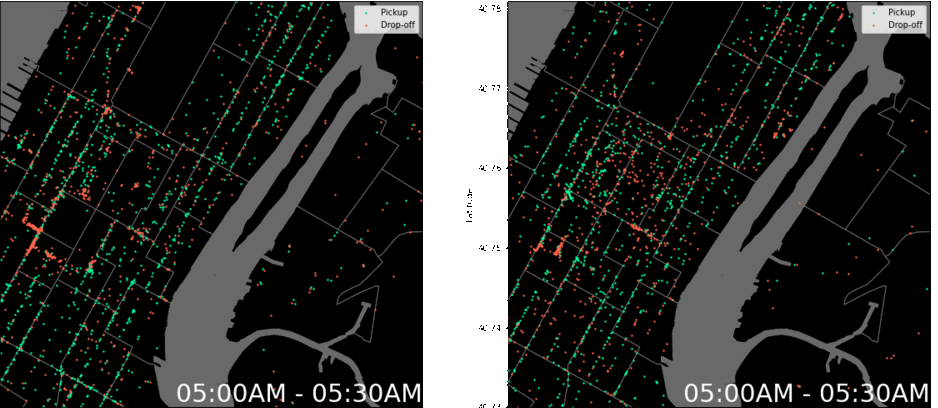

Import necessary modules:

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd

## 1. Initial drop-off and pick-up investigation

In [126]:
df = pd.read_csv('2014_Yellow_Taxi_Trip_Data (9).csv') # Random day for baseline
df2 = pd.read_csv('2014_Yellow_Taxi_Trip_Data (7).csv') # St Patricks Day Parade data

In [129]:
df.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,mta_tax,tip_amount,tolls_amount,total_amount,imp_surcharge,extra,rate_code
0,VTS,03/10/2014 04:00:00 AM,03/10/2014 04:02:00 AM,1,0.57,-73.993677,40.720130,NaN,-73.983000,40.766652,CSH,4.0,0.5,0.0,0.0,5.0,0.5,NaN,1
1,VTS,03/10/2014 04:00:00 AM,03/10/2014 04:03:00 AM,2,0.84,-73.992627,40.768550,NaN,-73.983362,40.762902,CSH,5.0,0.5,0.0,0.0,6.0,0.5,NaN,1
2,VTS,03/10/2014 04:00:00 AM,03/10/2014 04:03:00 AM,6,0.60,-73.946370,40.780890,NaN,-73.948572,40.773717,CSH,4.5,0.5,0.0,0.0,5.5,0.5,NaN,1
3,VTS,03/10/2014 04:00:00 AM,03/10/2014 04:03:00 AM,1,0.57,-73.941440,40.806042,NaN,-73.992195,40.717600,CRD,4.0,0.5,0.0,0.0,5.0,0.5,NaN,1
4,VTS,03/10/2014 04:00:00 AM,03/10/2014 04:04:00 AM,2,0.78,-73.979980,40.748395,NaN,-73.990995,40.750567,CRD,5.0,0.5,1.1,0.0,7.1,0.5,NaN,1


In [130]:
df2.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,mta_tax,tip_amount,tolls_amount,total_amount,imp_surcharge,extra,rate_code
0,VTS,03/17/2014 05:00:00 AM,03/17/2014 05:01:00 AM,1,0.23,-73.956665,40.762742,NaN,-73.955127,40.764822,CSH,3.0,0.5,0.00,0.00,4.00,0.5,NaN,1
1,VTS,03/17/2014 05:00:00 AM,03/17/2014 05:23:00 AM,1,10.53,-73.781302,40.644955,NaN,-73.865825,40.771042,CRD,31.0,0.5,9.21,5.33,46.54,0.5,NaN,1
2,VTS,03/17/2014 05:00:00 AM,03/17/2014 05:26:00 AM,1,17.47,-73.985940,40.777482,NaN,-74.177167,40.695062,CRD,64.5,0.0,32.00,11.00,108.00,0.5,NaN,3
3,VTS,03/17/2014 05:00:00 AM,03/17/2014 05:11:00 AM,5,3.27,-73.998625,40.760527,NaN,-73.984970,40.728007,CRD,12.5,0.5,2.00,0.00,15.50,0.5,NaN,1
4,VTS,03/17/2014 05:00:00 AM,03/17/2014 05:05:00 AM,1,0.97,-73.997875,40.756155,NaN,-73.981942,40.759372,CRD,5.5,0.5,1.20,0.00,7.70,0.5,NaN,1


Bounds for NYC

In [131]:
min_lat, max_lat = 40.68, 40.88
min_lon, max_lon = -74.02, -73.91

In [137]:
df_subset1= df.head(5000)

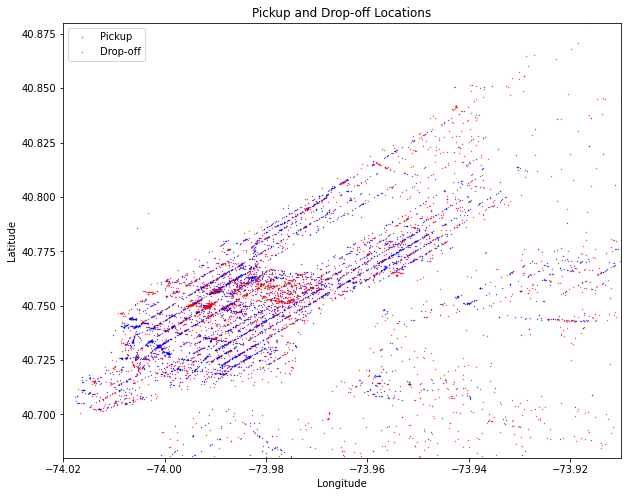

In [138]:
# Create a scatter plot of the longitude and latitude coordinates
fig, ax = plt.subplots(figsize=(10, 8))

marker_size = 0.1

# Plot pickup locations (blue)
ax.scatter(df_subset1['pickup_longitude'], df_subset1['pickup_latitude'], color='blue', label='Pickup', s=marker_size)

# Plot drop-off locations (red)
ax.scatter(df_subset1['dropoff_longitude'], df_subset1['dropoff_latitude'], color='red', label='Drop-off', s=marker_size)

ax.set_xlim(-74.02, -73.91)
ax.set_ylim(40.68, 40.88)

# Set x and y-axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Set the title of the plot
ax.set_title('Pickup and Drop-off Locations')

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [143]:
gdf = gpd.read_file('C:\\Users\\mayak\\Downloads\\taxi zones\\taxi_zones\\taxi_zones.shp')

Plotting the map of all NYC boroughs using the taxi zone shape file from the TLC.

In [58]:
gdf.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


In [156]:
# Convert 'pickup_datetime' column to datetime
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df2['pickup_datetime'] = pd.to_datetime(df2['pickup_datetime'])

In [160]:
df_subset2 = df2.head(10000)

## 2. Investigating taxi trends on St Patrick's Day
### 2.1 Plotting a subset of the St. Patrick's Day Trips


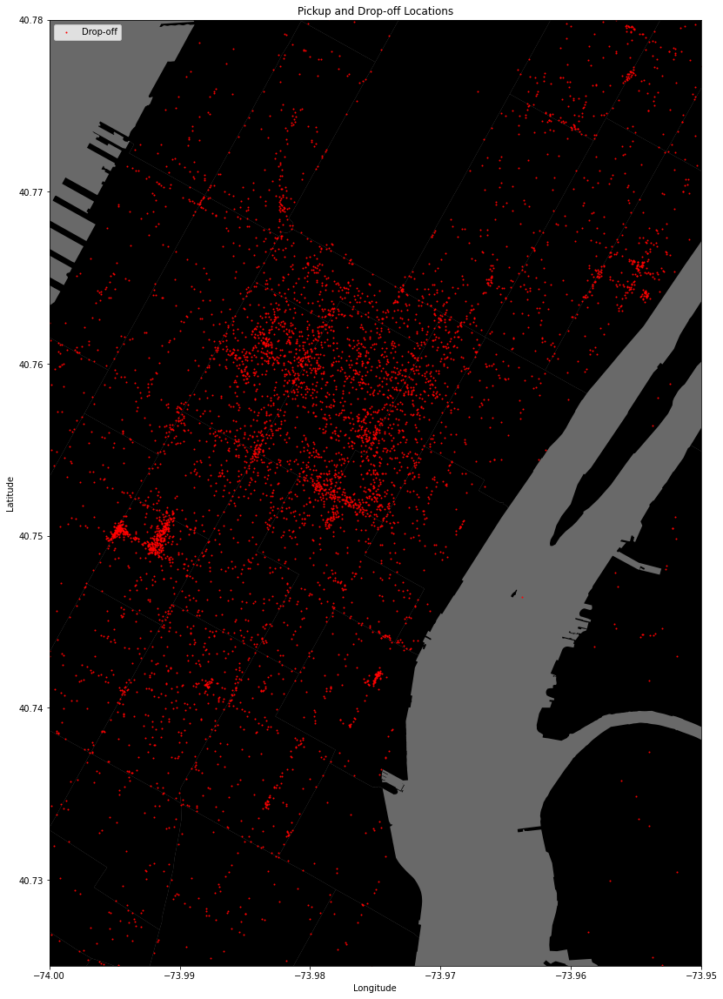

In [161]:
# Create a scatter plot of the longitude and latitude coordinates
fig, ax = plt.subplots(figsize=(20, 20))

marker_size = 1
# Plot the Manhattan GeoDataFrame
gdf.plot(ax=ax, color='black')

# Plot pickup locations (blue)
# ax.scatter(df_subset2['pickup_longitude'], df_subset2['pickup_latitude'], color='green', label='Pickup', s=marker_size)

# Plot drop-off locations (red)
ax.scatter(df_subset2['dropoff_longitude'], df_subset2['dropoff_latitude'], color='red', label='Drop-off', s=marker_size)
ax.set_facecolor('dimgray')
ax.set_xlim(-74.00, -73.95)
ax.set_ylim(40.725, 40.780)

# Set x and y-axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Set the title of the plot
ax.set_title('Pickup and Drop-off Locations')

# Add a legend
ax.legend()

# Show the plot
plt.show()

### 2.2 Plotting the baseline and St. Patrick's Day data from 5am to 7pm

In [ ]:
time_intervals = [
                  ('5:00:00 AM', '5:30:00 AM'),
                  ('5:30:00 AM', '6:00:00 AM'),
                  ('6:00:00 AM', '6:30:00 AM'),
                  ('6:30:00 AM', '7:00:00 AM'),
                  ('7:00:00 AM', '7:30:00 AM'),
                  ('7:30:00 AM', '8:00:00 AM'),
                  ('8:00:00 AM', '8:30:00 AM'),
                  ('8:30:00 AM', '9:00:00 AM'),
                  ('9:00:00 AM', '9:30:00 AM'),
                  ('9:30:00 AM', '10:00:00 AM'),
                  ('10:00:00 AM', '10:30:00 AM'),
                  ('10:30:00 AM', '11:00:00 AM'),
                  ('11:00:00 AM', '11:30:00 AM'),
                  ('11:30:00 AM', '12:00:00 PM'),
                  ('12:00:00 PM', '12:30:00 PM'),
                  ('12:30:00 PM', '1:00:00 PM'),
                  ('1:00:00 PM', '1:30:00 PM'),
                  ('1:30:00 PM', '2:00:00 PM'),
                  ('2:00:00 PM', '2:30:00 PM'),
                  ('2:30:00 PM', '3:00:00 PM'),
                  ('3:00:00 PM', '3:30:00 PM'),
                  ('3:30:00 PM', '4:00:00 PM'),
                  ('4:00:00 PM', '4:30:00 PM'),
                  ('4:30:00 PM', '5:00:00 PM'),
                  ('5:00:00 PM', '5:30:00 PM'),
                  ('5:30:00 PM', '6:00:00 PM'),
                  ('6:00:00 PM', '6:30:00 PM'),
                  ('6:30:00 PM', '7:00:00 PM')]



marker_size = 2

# Iterate over the time intervals and create plots
for i, (start_time, end_time) in enumerate(time_intervals):
    # Create a new figure for each plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

    # Filter DataFrame for the current interval
    start_time = pd.to_datetime(start_time).time()
    end_time = pd.to_datetime(end_time).time()
    df_interval = df[(df['pickup_datetime'].dt.time >= start_time) & (df['pickup_datetime'].dt.time <= end_time)]
    df_interval2 = df2[(df2['pickup_datetime'].dt.time >= start_time) & (df2['pickup_datetime'].dt.time <= end_time)]

    # Plot the Manhattan GeoDataFrame
    gdf.plot(ax=ax1, color='black', edgecolor='dimgray', linewidth=1)
    gdf.plot(ax=ax2, color='black', edgecolor='dimgray', linewidth=1)
    # Plot pickup locations (blue)
    # Specify the zone you want to change the color
    target_zone = 'Chinatown'

    # Filter the DataFrame to get the geometry of the target zone
    target_geometry = gdf[gdf['zone'] == target_zone]['geometry']
    #ax.scatter(40.765, -73.97,  color='green', marker='+', s=200)
    # Plot the target zone with a specific color
    #target_geometry.plot(facecolor='#541511', ax=plt.gca())
    ax1.scatter(df_interval['pickup_longitude'], df_interval['pickup_latitude'], color='mediumspringgreen', label='Pickup', s=marker_size)
    ax2.scatter(df_interval2['pickup_longitude'], df_interval2['pickup_latitude'], color='mediumspringgreen', label='Pickup', s=marker_size)
    #ax.scatter(-73.989578, 40.750797,  color='green', marker='+', s=100)
    # Plot drop-off locations (red)
    ax1.scatter(df_interval['dropoff_longitude'], df_interval['dropoff_latitude'], color='tomato', label='Drop-off', s=marker_size)
    ax2.scatter(df_interval2['dropoff_longitude'], df_interval2['dropoff_latitude'], color='tomato', label='Drop-off', s=marker_size)
    ax1.set_facecolor('dimgray')
    ax1.set_xlim(-74.00, -73.93)
    ax1.set_ylim(40.73, 40.781)
    ax2.set_facecolor('dimgray')
    ax2.set_xlim(-74.00, -73.93)
    ax2.set_ylim(40.73, 40.781)
    
#     plt.xticks([])

#     # Remove ticks and labels on the y-axis
#     plt.yticks([])
    # Set x and y-axis labels
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax2.set_xlabel('Longitude')
    ax2.set_ylabel('Latitude')

    # Set the title of the plot
    time_text = f"{start_time.strftime('%I:%M%p')} - {end_time.strftime('%I:%M%p')}"
    ax1.set_title('Baseline')
    ax1.text(-73.93, 40.73, time_text, color='white', fontsize=30, ha='right', va='bottom')

    # Add a legend
    ax1.legend()
    
    ax2.set_title('St. Patrick\'s Day Parade')
    ax2.text(-73.93, 40.73, time_text, color='white', fontsize=30, ha='right', va='bottom')

    # Add a legend
    ax2.legend()
    

    # Save the figure
    plt.savefig(f"fig_{i}_joined2014.png")
    plt.show()
    # Close the figure
    plt.close(fig)

## 3. Macy's Thanksgiving Day Parade

In [182]:
df3 = pd.read_csv('2014_Yellow_Taxi_Trip_Data (1).csv') # Thanksgiving Parade data
df4 = pd.read_csv('2014_Yellow_Taxi_Trip_Data (3).csv') # Random day for baseline

In [184]:
# Convert 'pickup_datetime' column to datetime
df3['pickup_datetime'] = pd.to_datetime(df3['pickup_datetime'])
df4['pickup_datetime'] = pd.to_datetime(df4['pickup_datetime'])

In [188]:
df3.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,mta_tax,tip_amount,tolls_amount,total_amount,imp_surcharge,extra,rate_code
186905,VTS,2014-11-27 20:00:00,11/27/2014 08:25:00 PM,2,8.24,-73.957068,40.817580,NaN,-73.927842,40.742132,CSH,27.0,0.5,0.0,0.00,28.00,0.5,NaN,1
186906,VTS,2014-11-27 20:00:00,11/27/2014 08:27:00 PM,1,10.56,-73.955715,40.764137,NaN,-73.960613,40.659540,CRD,32.5,0.5,8.0,0.00,41.50,0.5,NaN,1
186907,VTS,2014-11-27 20:00:00,11/27/2014 08:28:00 PM,6,14.41,-73.976918,40.764925,NaN,-74.028133,40.622760,CRD,40.0,0.5,8.1,0.00,49.10,0.5,NaN,1
186908,VTS,2014-11-27 20:00:00,11/27/2014 08:31:00 PM,1,11.31,-73.986920,40.739647,NaN,-73.876357,40.831652,CRD,34.5,0.5,0.0,0.00,35.50,0.5,NaN,1
186909,VTS,2014-11-27 20:00:00,11/27/2014 08:41:00 PM,1,14.09,-73.958035,40.801415,NaN,-73.886157,40.732212,CRD,46.0,0.5,5.0,5.33,57.33,0.5,NaN,1


In [ ]:
time_intervals = [('5:00:00 AM', '5:30:00 AM'),
                  ('5:30:00 AM', '6:00:00 AM'),
                  ('6:00:00 AM', '6:30:00 AM'),
                  ('6:30:00 AM', '7:00:00 AM'),
                  ('7:00:00 AM', '7:30:00 AM'),
                  ('7:30:00 AM', '8:00:00 AM'),
                  ('8:00:00 AM', '8:30:00 AM'),
                  ('8:30:00 AM', '9:00:00 AM'),
                  ('9:00:00 AM', '9:30:00 AM'),
                  ('9:30:00 AM', '10:00:00 AM'),
                  ('10:00:00 AM', '10:30:00 AM'),
                  ('10:30:00 AM', '11:00:00 AM'),
                  ('11:00:00 AM', '11:30:00 AM'),
                  ('11:30:00 AM', '12:00:00 PM'),
                  ('12:00:00 PM', '12:30:00 PM'),
                  ('12:30:00 PM', '1:00:00 PM'),
                  ('1:00:00 PM', '1:30:00 PM'),
                  ('1:30:00 PM', '2:00:00 PM'),
                  ('2:00:00 PM', '2:30:00 PM'),
                  ('2:30:00 PM', '3:00:00 PM'),
                  ('3:00:00 PM', '3:30:00 PM'),
                  ('3:30:00 PM', '4:00:00 PM'),
                  ('4:00:00 PM', '4:30:00 PM'),
                  ('4:30:00 PM', '5:00:00 PM'),
                  ('5:00:00 PM', '5:30:00 PM'),
                  ('5:30:00 PM', '6:00:00 PM'),
                  ('6:00:00 PM', '6:30:00 PM'),
                  ('6:30:00 PM', '7:00:00 PM'),
                  ('7:00:00 PM', '7:30:00 PM'),
                  ('7:30:00 PM', '8:00:00 PM'),
                  ('8:00:00 PM', '8:30:00 PM')]


marker_size = 2

# Iterate over the time intervals and create plots
for i, (start_time, end_time) in enumerate(time_intervals):
    # Create a new figure for each plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

    # Filter DataFrame for the current interval
    start_time = pd.to_datetime(start_time).time()
    end_time = pd.to_datetime(end_time).time()
    df_interval3 = df3[(df3['pickup_datetime'].dt.time >= start_time) & (df3['pickup_datetime'].dt.time <= end_time)]
    df_interval4 = df4[(df4['pickup_datetime'].dt.time >= start_time) & (df4['pickup_datetime'].dt.time <= end_time)]

    # Plot the Manhattan GeoDataFrame
    gdf.plot(ax=ax1, color='black', edgecolor='dimgray', linewidth=1)
    gdf.plot(ax=ax2, color='black', edgecolor='dimgray', linewidth=1)
    # Plot pickup locations (blue)
    # Specify the zone you want to change the color
    target_zone = 'Chinatown'

    # Filter the DataFrame to get the geometry of the target zone
    target_geometry = gdf[gdf['zone'] == target_zone]['geometry']
    #ax.scatter(40.765, -73.97,  color='green', marker='+', s=200)
    # Plot the target zone with a specific color
    #target_geometry.plot(facecolor='#541511', ax=plt.gca())
    ax1.scatter(df_interval3['pickup_longitude'], df_interval3['pickup_latitude'], color='mediumspringgreen', label='Pickup', s=marker_size)
    ax2.scatter(df_interval4['pickup_longitude'], df_interval4['pickup_latitude'], color='mediumspringgreen', label='Pickup', s=marker_size)
    #ax.scatter(-73.989578, 40.750797,  color='green', marker='+', s=100)
    # Plot drop-off locations (red)
    ax1.scatter(df_interval3['dropoff_longitude'], df_interval3['dropoff_latitude'], color='tomato', label='Drop-off', s=marker_size)
    ax2.scatter(df_interval4['dropoff_longitude'], df_interval4['dropoff_latitude'], color='tomato', label='Drop-off', s=marker_size)
    ax1.set_facecolor('dimgray')
    ax1.set_xlim(-74.00, -73.93)
    ax1.set_ylim(40.73, 40.781)
    ax2.set_facecolor('dimgray')
    ax2.set_xlim(-74.00, -73.93)
    ax2.set_ylim(40.73, 40.781)
    
#     plt.xticks([])

#     # Remove ticks and labels on the y-axis
#     plt.yticks([])
    # Set x and y-axis labels
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax2.set_xlabel('Longitude')
    ax2.set_ylabel('Latitude')

    # Set the title of the plot
    time_text = f"{start_time.strftime('%I:%M%p')} - {end_time.strftime('%I:%M%p')}"
    ax2.set_title('Baseline')
    ax1.text(-73.93, 40.73, time_text, color='white', fontsize=30, ha='right', va='bottom')

    # Add a legend
    ax1.legend()
    
    ax1.set_title('Macy\'s Thanksgiving Day Parade')
    ax2.text(-73.93, 40.73, time_text, color='white', fontsize=30, ha='right', va='bottom')

    # Add a legend
    ax2.legend()
    

    # Save the figure
    plt.savefig(f"fig_{i}_joined_Macy's.png")
    plt.show()
    # Close the figure
    plt.close(fig)